In [2]:
# We will use the following packages

# PyTorch package and submodules
import torch
import torch.nn as nn
from torch.optim import SGD #gradient descent optimizer

# NumPy for math operations, and Pandas for processing tabular data.
import numpy as np
import pandas as pd

# Plotly plotting package
import plotly.graph_objects as go
import plotly.express as px

# Decision tree classifier in sklearn
from sklearn.tree import DecisionTreeClassifier as DTC, plot_tree

# We use AUROC and average precision (AP) scores from sklearn
from sklearn.metrics import roc_auc_score, average_precision_score

#cross validation
from sklearn.model_selection import cross_val_score

#logistic regression
from sklearn.linear_model import LogisticRegression as logit # use build-in logistic regression model in sklearn

# Tools in sklearn to select best model
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.metrics import roc_curve, precision_recall_curve

#lasso select parameter
from sklearn.linear_model import LassoCV

#vif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Import matplotlib.pyplot to visualize tree models
import matplotlib.pyplot as plt

# We use f1 score to test model performance
from sklearn.metrics import f1_score

#XGBoost
from xgboost import XGBClassifier as XGBC
from xgboost import plot_tree
import graphviz

# Support Vector Classifier， use PCA to reduce dimension
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [3]:
# read data
df = pd.read_csv('sph6004_assignment1_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Columns: 162 entries, id to weight_admit
dtypes: float64(158), int64(2), object(2)
memory usage: 62.9+ MB


Data Cleaning：

In [4]:
#drop those columns with missing percentage > 50%
missing_percentage= df.isnull().mean() * 100
col_drop = missing_percentage[missing_percentage>50].index
df_dropcol = df.drop(columns=col_drop)
df_dropcol.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 87 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   50920 non-null  int64  
 1   aki                  50920 non-null  int64  
 2   gender               50920 non-null  object 
 3   admission_age        50920 non-null  float64
 4   race                 50920 non-null  object 
 5   heart_rate_min       50841 non-null  float64
 6   heart_rate_max       50841 non-null  float64
 7   heart_rate_mean      50841 non-null  float64
 8   sbp_min              50823 non-null  float64
 9   sbp_max              50823 non-null  float64
 10  sbp_mean             50823 non-null  float64
 11  dbp_min              50823 non-null  float64
 12  dbp_max              50823 non-null  float64
 13  dbp_mean             50823 non-null  float64
 14  mbp_min              50805 non-null  float64
 15  mbp_max              50805 non-null 

In [5]:
#handle factors, first to solve binary problems
df_dropcol['aki2'] = (df_dropcol['aki'] > 0).astype(int)
#split the df into X and Y part
X_df = df_dropcol.drop(columns=['id','aki','aki2'])
y_df = df_dropcol['aki2']

#identify continuous variables and categorial variables
var_cate = ['gender','race']
var_total = X_df.columns.tolist()
var_cont = var_total[1:2] + var_total[3:]

#give values to those na, for categorical variables, use modes
#for gender, change it to 0/1
X_df['gender'] = pd.get_dummies(X_df['gender'], prefix='gender').astype(int)['gender_F'] #if female, then 1
#for race, although it doesn't have na, it has "UNKNOWN" and "UNABLE TO OBTAIN" or "PATIENT DECLINED TO ANSWER", give it NA value
X_df['race'].replace(['UNKNOWN', 'UNABLE TO OBTAIN',"PATIENT DECLINED TO ANSWER"], pd.NA, inplace=True)
X_df['race2'] = X_df['race'].replace(to_replace=r'ASIAN.*', value='ASIAN', regex=True)
X_df['race2'] = X_df['race2'].replace(to_replace=r'BLACK.*', value='BLACK', regex=True)
X_df['race2'] = X_df['race2'].replace(to_replace=r'WHITE.*', value='WHITE', regex=True)
X_df['race2'] = X_df['race2'].replace(to_replace=r'HISPANIC.*', value='HISPANIC/LATINO', regex=True)
X_df['race2'] = X_df['race2'].where(X_df['race2'].isna(), 
                                    X_df['race2'].replace(to_replace=r'^(?!.*(ASIAN|BLACK|HISPANIC|WHITE)).*$', value='OTHER', regex=True))
#use mode - white giving to na
mode_race2 = X_df['race2'].mode()[0]
X_df['race2'] = X_df['race2'].fillna(mode_race2)
print(X_df['race2'].value_counts())
X_df1 = X_df.drop(columns=['race'])
#give dummy variables for race
dummy_race = pd.get_dummies(X_df1['race2'], prefix='race').astype(int)
combined_df = pd.concat([X_df1.drop(columns=['race2']), dummy_race[['race_ASIAN','race_BLACK','race_OTHER','race_WHITE']]], axis=1) 
#HISPANIC/LATINO is drop 

#replace the values for continuous factors, for those extreme values (<5% or >95%)
print(combined_df.describe())
X_df2 = combined_df 
for col in var_cont:
    # Calculate quantiles
    q5 = X_df2[col].quantile(0.05)
    q95 = X_df2[col].quantile(0.95)
    
    # Replace values less than 5th percentile with the 5th percentile value
    X_df2[col] = X_df2[col].apply(lambda x: q5 if x < q5 else x)
    
    # Replace values greater than 95th percentile with the 95th percentile value
    X_df2[col] = X_df2[col].apply(lambda x: q95 if x > q95 else x)

#use median to give values for na in continuous factors
X_df3=X_df2
X_df3[var_cont]= X_df2[var_cont].fillna(X_df2[var_cont].median())

#standardize the continuous data
X_df4 = X_df3
X_df4[var_cont] = (X_df4[var_cont]-X_df4[var_cont].mean())/X_df4[var_cont].std()

race2
WHITE              40880
BLACK               4640
OTHER               2169
HISPANIC/LATINO     1735
ASIAN               1496
Name: count, dtype: int64
             gender  admission_age  heart_rate_min  heart_rate_max  \
count  50920.000000   50920.000000    50841.000000    50841.000000   
mean       0.441477      64.942008       69.902996      102.494951   
std        0.496568      17.278264       15.141810       20.481365   
min        0.000000      18.002527        1.000000       36.000000   
25%        0.000000      54.503884       60.000000       88.000000   
50%        0.000000      66.713334       69.000000      100.000000   
75%        1.000000      78.151289       79.000000      114.000000   
max        1.000000     102.865603      167.000000      280.000000   

       heart_rate_mean       sbp_min       sbp_max      sbp_mean  \
count     50841.000000  50823.000000  50823.000000  50823.000000   
mean         84.266427     93.250232    148.234674    119.102894   
std     

In [6]:
#remove those vif>10
X = add_constant(X_df4)

# Define a function to calculate VIF and drop variables exceeding a threshold
def calculate_vif_and_drop(X, thresh=10.0):
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]

        max_vif = max(vif)
        max_ix = vif.index(max_vif)
        if max_vif > thresh:
            del variables[max_ix]
            dropped = True

    print('Remaining variables:', X.columns[variables])
    return X.iloc[:, variables]

# Use the function to calculate VIF and drop variables with VIF over 10
X_new = calculate_vif_and_drop(X) #50920*73

Remaining variables: Index(['gender', 'admission_age', 'heart_rate_min', 'heart_rate_max',
       'sbp_min', 'sbp_max', 'sbp_mean', 'dbp_min', 'dbp_max', 'dbp_mean',
       'mbp_min', 'mbp_max', 'resp_rate_min', 'resp_rate_max',
       'resp_rate_mean', 'temperature_min', 'temperature_max', 'spo2_min',
       'spo2_max', 'spo2_mean', 'glucose_min', 'glucose_max', 'lactate_min',
       'lactate_max', 'ph_min', 'ph_max', 'po2_min', 'po2_max', 'pco2_min',
       'pco2_max', 'totalco2_min', 'totalco2_max', 'hematocrit_min.1',
       'hemoglobin_max.1', 'platelets_max', 'wbc_min', 'wbc_max',
       'aniongap_min', 'aniongap_max', 'bicarbonate_min.1',
       'bicarbonate_max.1', 'bun_min', 'calcium_min.1', 'calcium_max.1',
       'chloride_min.1', 'chloride_max.1', 'glucose_min.2', 'glucose_max.2',
       'sodium_min.1', 'sodium_max.1', 'potassium_min.1', 'potassium_max.1',
       'abs_basophils_min', 'abs_basophils_max', 'abs_eosinophils_min',
       'abs_eosinophils_max', 'abs_lymphocytes_

Remaining variables: Index(['gender', 'admission_age', 'heart_rate_min', 'heart_rate_max',
       'sbp_min', 'sbp_max', 'sbp_mean', 'dbp_min', 'dbp_max', 'dbp_mean',
       'mbp_min', 'mbp_max', 'resp_rate_min', 'resp_rate_max',
       'resp_rate_mean', 'temperature_min', 'temperature_max', 'spo2_min',
       'spo2_max', 'spo2_mean', 'glucose_min', 'glucose_max', 'lactate_min',
       'lactate_max', 'ph_min', 'ph_max', 'po2_min', 'po2_max', 'pco2_min',
       'pco2_max', 'totalco2_min', 'totalco2_max', 'hematocrit_min.1',
       'hemoglobin_max.1', 'platelets_max', 'wbc_min', 'wbc_max',
       'aniongap_min', 'aniongap_max', 'bicarbonate_min.1',
       'bicarbonate_max.1', 'bun_min', 'calcium_min.1', 'calcium_max.1',
       'chloride_min.1', 'chloride_max.1', 'glucose_min.2', 'glucose_max.2',
       'sodium_min.1', 'sodium_max.1', 'potassium_min.1', 'potassium_max.1',
       'abs_basophils_min', 'abs_basophils_max', 'abs_eosinophils_min',
       'abs_eosinophils_max', 'abs_lymphocytes_max', 'abs_monocytes_min',
       'abs_monocytes_max', 'abs_neutrophils_min', 'inr_max', 'pt_min',
       'ptt_min', 'ptt_max', 'gcs_min', 'gcs_motor', 'gcs_verbal', 'gcs_eyes',
       'weight_admit', 'race_ASIAN', 'race_BLACK', 'race_OTHER', 'race_WHITE'],
      dtype='object')

Split train set and test set

In [7]:
X_train, X_test, y_train, y_test = train_test_split(
    X_new,y_df,test_size=0.3,random_state=10,
    stratify=y_df, shuffle=True
)

Try logistic regression

In [8]:
y_df.value_counts()
#about 1:0 ~= 2:1, don't need imbalanced LR

aki2
1    34060
0    16860
Name: count, dtype: int64

use logistic regression (L1) first, wanting to force some factors to be 0 to simplify the model

In [38]:
lasso_cv = LassoCV(cv=5, random_state=0, max_iter=10000)
lasso_cv.fit(X_train, y_train)
print(f'Optimal alpha (penalty term): {lasso_cv.alpha_}')
#Optimal alpha (penalty term): 0.0001587170124790795
#maybe not so sensitive to regularization, try stepwise then

Optimal alpha (penalty term): 0.0001587170124790795


In [45]:
#random seed
seed = 100
torch.manual_seed(seed)
np.random.seed(seed)
X = torch.tensor(X_new.to_numpy(),dtype=torch.float32)
m,n = X.shape
y = torch.tensor(y_df.to_numpy(),dtype=torch.float32).reshape(m,1)
# We use an approx 8:2 train test splitting
cases = ['train','test']
case_list = np.random.choice(cases,size=X.shape[0],replace=True,p=[0.7,0.3])
X_train = X[case_list=='train']
X_test = X[case_list=='test']
y_train = y[case_list=='train']
y_test = y[case_list=='test']

In [46]:
# Define L_1 regularization
def L1_reg(model,lbd):
    result = torch.tensor(0)
    for param in model.parameters(): # iterate over all parameters of our model
        result = result + param.abs().sum()

    return lbd*result

def train_with_l1_regularization(X_train, y_train, X_test, y_test, lbd_values):
    results = []
    
    for lbd in lbd_values:
        h_L1 = torch.nn.Linear(
            in_features=n,
            out_features=1,
            bias=True
        )
        sigma = torch.nn.Sigmoid()

        f_L1 = torch.nn.Sequential(
            h_L1,
            sigma
        )

        J_BCE = torch.nn.BCELoss()

        GD_optimizer = torch.optim.Adam(lr=0.01, params=f_L1.parameters())

        nIter = 5000
        printInterval = 500

        for i in range(nIter):
            GD_optimizer.zero_grad()
            pred = f_L1(X_train)
            loss = J_BCE(pred, y_train)
            (loss + L1_reg(f_L1, lbd)).backward()
            GD_optimizer.step()
            
        with torch.no_grad():
            pred_test = f_L1(X_test)

        auroc = roc_auc_score(y_test, pred_test)
        ap = average_precision_score(y_test, pred_test)
        
        results.append({'lbd': lbd, 'AUROC': auroc, 'AP': ap})
        
    return results

# Define a list of values for the regularization strength
lbd_values = [0.001, 0.003, 0.006, 0.009]

# Call the function to train models with different values of lbd
results = train_with_l1_regularization(X_train, y_train, X_test, y_test, lbd_values)

# Print the results
for result in results:
    print('lbd: {}, AUROC: {:.3f}, AP: {:.3f}'.format(result['lbd'], result['AUROC'], result['AP']))
# also smaller = better here

lbd: 0.001, AUROC: 0.758, AP: 0.854
lbd: 0.003, AUROC: 0.756, AP: 0.852
lbd: 0.006, AUROC: 0.753, AP: 0.850
lbd: 0.009, AUROC: 0.752, AP: 0.849


In [18]:
#however, use 1 L1 regression model with panelty = 0.1
lr1 = logit(penalty='l1', C=10,solver='liblinear') 
lr1.fit(X_train, y_train)
y_pred_full = lr1.predict_proba(X_test)

In [48]:
X_train, X_test, y_train, y_test = train_test_split(
    X_new,y_df,test_size=0.3,random_state=10,
    stratify=y_df, shuffle=True
)

try forward selection now

In [13]:
lr = logit(solver='liblinear') 
# Forward feature selection.
forward_selection = SFS(
    lr, n_features_to_select=20, direction="forward"
).fit(X_train, y_train)

In [16]:
forward_col = forward_selection.get_feature_names_out()
print(forward_col)
# Model with forward selected features
lr.fit(forward_selection.transform(X_train),y_train)
y_pred_FS = lr.predict_proba(forward_selection.transform(X_test))


['admission_age' 'sbp_min' 'sbp_max' 'resp_rate_max' 'temperature_min'
 'temperature_max' 'spo2_min' 'spo2_mean' 'ph_min' 'po2_max'
 'totalco2_min' 'bun_min' 'chloride_min.1' 'sodium_max.1'
 'potassium_max.1' 'abs_neutrophils_min' 'inr_max' 'gcs_verbal'
 'weight_admit' 'race_OTHER']


['admission_age' 'sbp_min' 'sbp_max' 'resp_rate_max' 'temperature_min'
 'temperature_max' 'spo2_min' 'spo2_mean' 'ph_min' 'po2_max'
 'totalco2_min' 'bun_min' 'chloride_min.1' 'sodium_max.1'
 'potassium_max.1' 'abs_neutrophils_min' 'inr_max' 'gcs_verbal'
 'weight_admit' 'race_OTHER']

In [48]:
#comparison between models
auroc1 = roc_auc_score(y_test,y_pred_full[:,1])
auroc2 = roc_auc_score(y_test,y_pred_FS[:,1])
print(f'AUROC1: {auroc1}, AUROC2: {auroc2}')

AUROC1: 0.7564212659089191, AUROC2: 0.743202572995298


In [22]:
y_pred_full_binary = (y_pred_full[:,1] >= 0.5).astype(int)
y_pred_FS_binary = (y_pred_FS[:,1] >= 0.5).astype(int)
f1_full = f1_score(y_test, y_pred_full_binary, average='binary')
f1_FS = f1_score(y_test, y_pred_FS_binary, average='binary')
print(f'F1 score for full model: {f1_full}, F1 score for forward model: {f1_FS}')

F1 score for full model: 0.8125991389077725, F1 score for forward model: 0.8098126432133711


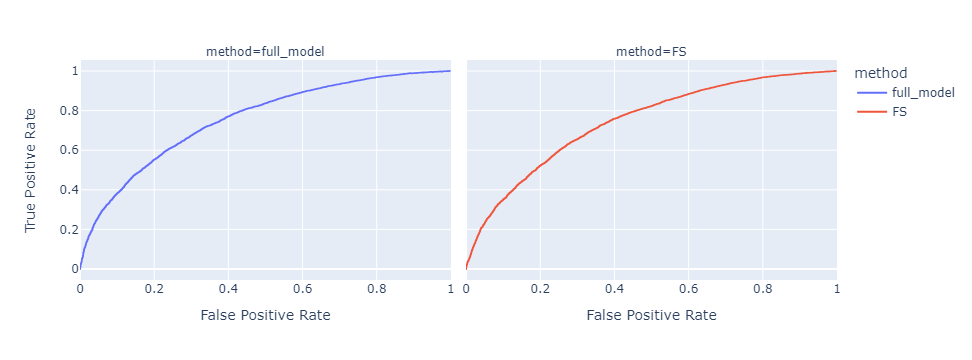

In [18]:
# roc_curve
fpr_full, tpr_full, _ = roc_curve(y_test,y_pred_full[:,1])
fpr_FS, tpr_FS, _ = roc_curve(y_test,y_pred_FS[:,1])

roc_df = pd.DataFrame(
    {
        'False Positive Rate':np.hstack([fpr_full,fpr_FS]),
        'True Positive Rate':np.hstack([tpr_full,tpr_FS]),
        'method':['full_model']*len(fpr_full)+['FS']*len(fpr_FS)
    }
)

# Visualize ROC curve
fig = px.line(roc_df,y='True Positive Rate',x='False Positive Rate',facet_col='method',color='method')
fig

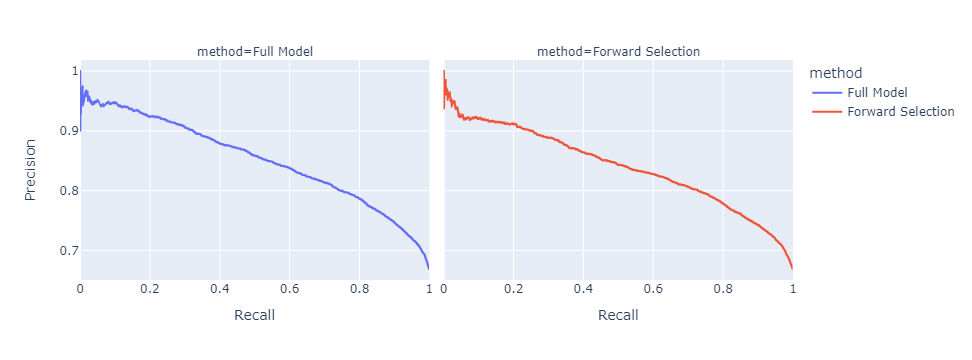

In [20]:
# precision recall curves
p_full, r_full, _ = precision_recall_curve(y_test,y_pred_full[:,1])
p_FS, r_FS, _ = precision_recall_curve(y_test,y_pred_FS[:,1])

pr_df = pd.DataFrame(
    {
        'Precision':np.hstack([p_full,p_FS]),
        'Recall':np.hstack([r_full,r_FS]),
        'method':['Full Model']*len(p_full)+['Forward Selection']*len(p_FS)
    }
)

# Visualize precision recall curve
fig = px.line(pr_df,x='Recall',y='Precision',facet_col='method',color='method')
fig

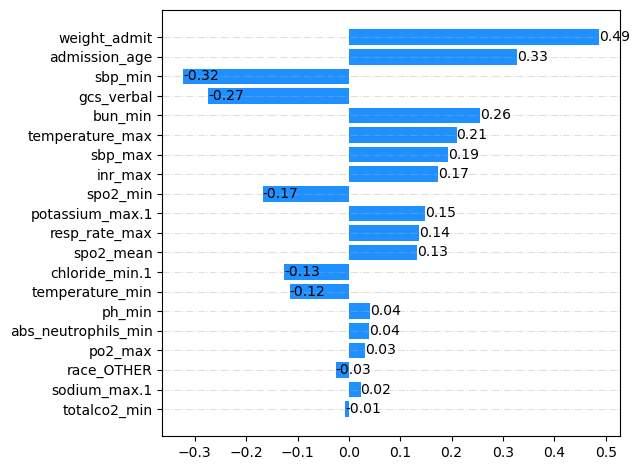

In [37]:
#plot the variables' importance for model_fr (then get top 20)
coef_lr = pd.DataFrame({'var': forward_col, 'coef': lr.coef_.flatten()})
index_sort = np.abs(coef_lr['coef']).sort_values().index
coef_lr_sort = coef_lr.loc[index_sort,:]

fig, ax = plt.subplots()
x, y = coef_lr_sort['var'], coef_lr_sort['coef']
rects = plt.barh(x, y, color='dodgerblue')
plt.grid(linestyle="-.", axis='y', alpha=0.4)
plt.tight_layout()
for rect in rects:
    w = rect.get_width()
    ax.text(w, rect.get_y()+rect.get_height()/2,'%.2f' %w, ha='left', va='center')

Tree-based models

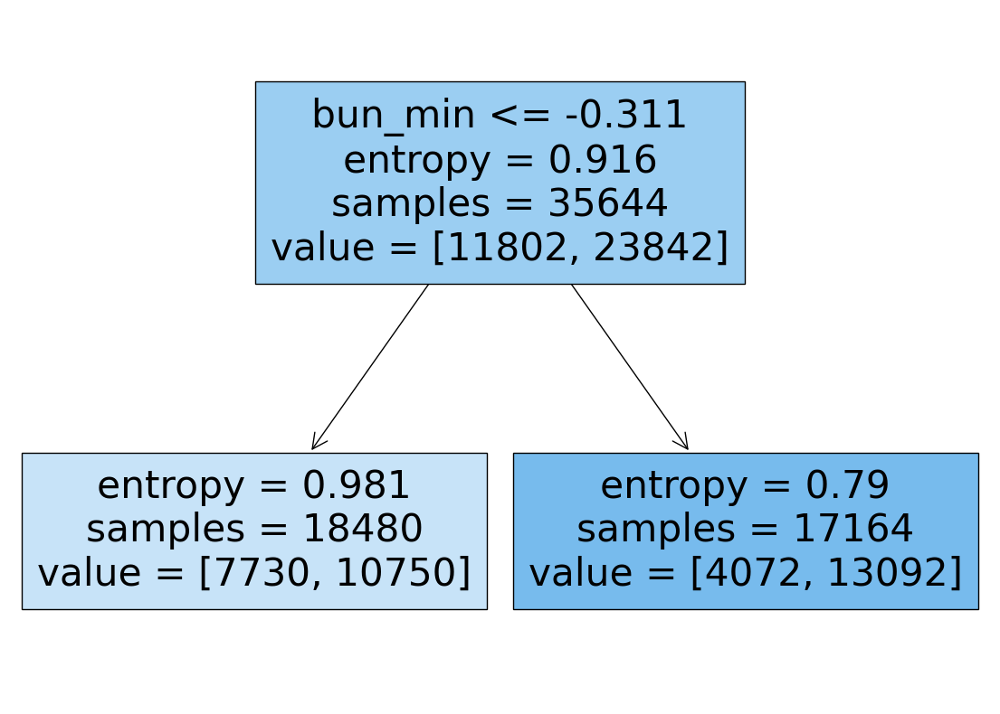

In [66]:
# We first build a shallow decision tree.
TreeModel = DTC(criterion='entropy', max_depth=1, random_state=15)
TreeModel.fit(X_train, y_train)

plt.figure(figsize=(14, 10))
plot_tree(
    TreeModel,
    filled=True,
    feature_names=X_train.columns.tolist(),
)
plt.show()

In [61]:
y_pred = TreeModel.predict(X_test)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test,y_pred)))
pd.crosstab(y_test,y_pred)

F1 score on test set: 0.8016


col_0,1
aki2,
0,5058
1,10218


In [40]:
# The `max_depth` parameter is important for decision tree.
# We use `GridSearchCV` to select the best `max_depth`.
parameters = {'max_depth':np.arange(start=1,stop=10,step=1)}
stratifiedCV = StratifiedKFold(n_splits=5)
TreeModel = DTC(criterion='entropy')
BestTree = GridSearchCV(
    TreeModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV
)
BestTree.fit(X_train,y_train) #max_depth=4, best score=0.806

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(criterion='entropy'),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [41]:
BestTree.best_score_

0.806191408905223

In [42]:
y_pred_dt = BestTree.predict(X_test)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test,y_pred_dt)))
pd.crosstab(y_test,y_pred_dt)

F1 score on test set: 0.8090


col_0,0,1
aki2,,
0,1215,3843
1,667,9551


In [45]:
auroc = roc_auc_score(y_test,y_pred_dt)
auroc

0.5874682804540727

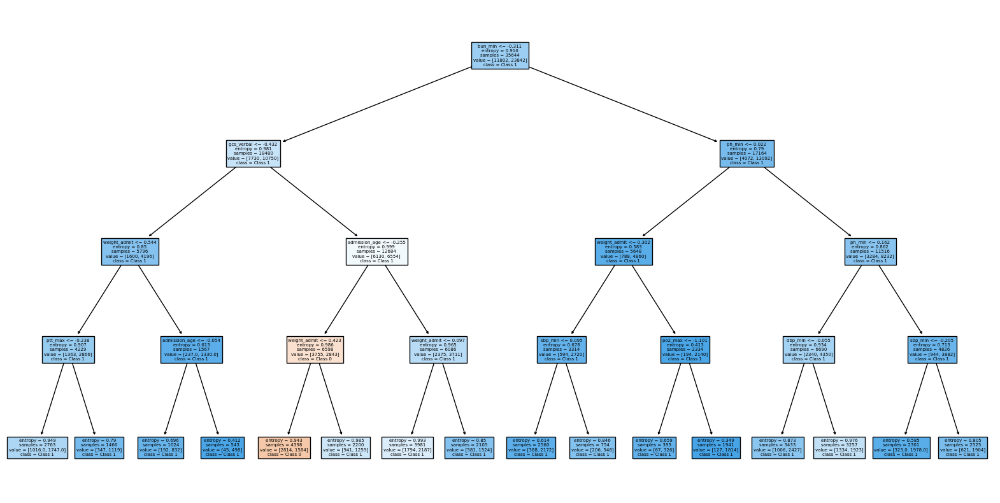

In [65]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming BestTree.best_estimator_ is your trained DecisionTreeClassifier model
plt.figure(figsize=(20, 10))  # Adjust the size as needed
plot_tree(
    BestTree.best_estimator_,
    filled=True,
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1']  # Adjust class names as appropriate
)
plt.show()

In [24]:
# Then build a XGBoost
parameters = {
    'n_estimators':np.arange(start=2,stop=20,step=2),
    'max_depth':np.arange(start=2,stop=6,step=1),
    'learning_rate':np.arange(start=0.05,stop=0.4,step=0.05)
}
stratifiedCV = StratifiedKFold(n_splits=5)
# XGBC: XGBoost classifier
XGBoostModel = XGBC()
BestXGBoost = GridSearchCV(
    XGBoostModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1 # use all cpu cores to speedup grid search
)
BestXGBoost.fit(X_train,y_train)

Fitting 5 folds for each of 252 candidates, totalling 1260 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'max_depth': array([2, 3, 4, 5]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1', verbose=1)

In [25]:
BestXGBoost.best_params_

{'learning_rate': 0.15000000000000002, 'max_depth': 4, 'n_estimators': 16}

In [26]:
BestXGBoost.best_score_

0.8198333825465538

In [46]:
y_pred_xg = BestXGBoost.predict(X_test)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test,y_pred_xg)))
pd.crosstab(y_test,y_pred_xg)

F1 score on test set: 0.8187


col_0,0,1
aki2,,
0,1536,3522
1,696,9522


In [47]:
auroc = roc_auc_score(y_test,y_pred_xg)
auroc

0.617781125903698

In [67]:
best_xgb_model = BestXGBoost.best_estimator_

Try SVM

In [ ]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':np.arange(start=1,stop=10,step=5)
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='linear')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1
)
BestSVC.fit(X_train,y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


In [ ]:
# when C=10, the result is best
SVCModel = SVC(kernel='linear', C=10)
SVCModel.fit(X_train,y_train)

In [9]:
# Setting up PCA to reduce the data to 20 dimensions
pca = PCA(n_components=20)

# Setting up the SVM model with a linear kernel and C=10
svc = SVC(kernel='linear', C=10)

# Creating a pipeline that first applies PCA and then trains the SVM model
pipeline = Pipeline([
    ('pca', pca),
    ('svc', svc)
])

# Fitting the pipeline to the training data
pipeline.fit(X_train, y_train)

Pipeline(steps=[('pca', PCA(n_components=20)),
                ('svc', SVC(C=10, kernel='linear'))])

In [49]:
y_pred_svm = pipeline.predict(X_test)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test,y_pred)))
pd.crosstab(y_test,y_pred_svm)

F1 score on test set: 0.8187


col_0,0,1
aki2,,
0,1525,3533
1,821,9397


In [50]:
auroc = roc_auc_score(y_test,y_pred_svm)
auroc

0.6105770827049793

final plot

In [59]:
y_pred_proba_FS = lr.predict_proba(forward_selection.transform(X_test))[:, 1]
y_pred_proba_dt = BestTree.predict_proba(X_test)[:, 1]
y_pred_proba_xg = BestXGBoost.predict_proba(X_test)[:, 1]
y_pred_proba_svm = pipeline.predict(X_test)

fpr_FS, tpr_FS, _ = roc_curve(y_test, y_pred_proba_FS)
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_pred_proba_dt)
fpr_xg, tpr_xg, _ = roc_curve(y_test, y_pred_proba_xg)
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_pred_proba_svm)

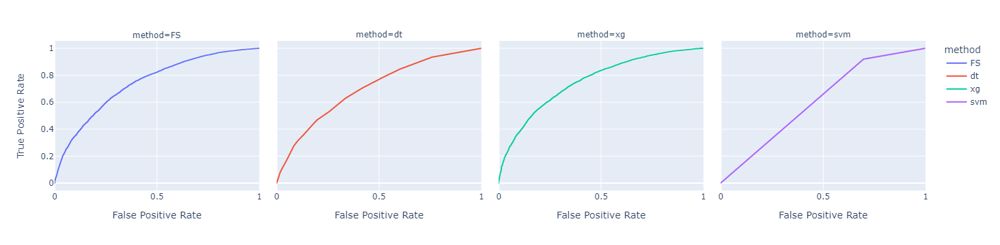

In [61]:
roc_df = pd.DataFrame(
    {
        'False Positive Rate':np.hstack([fpr_FS, fpr_dt, fpr_xg, fpr_svm]),
        'True Positive Rate':np.hstack([tpr_FS, tpr_dt, tpr_xg, tpr_svm]),
        'method':['FS']*len(fpr_FS)+['dt']*len(fpr_dt)+['xg']*len(fpr_xg)+['svm']*len(fpr_svm)
    }
)

# Visualize ROC curve
fig = px.line(roc_df,y='True Positive Rate',x='False Positive Rate',facet_col='method',color='method')
fig